<a href="https://colab.research.google.com/github/aditya083-etce/mL-Model-Dog-breed-identification/blob/main/Dog_breed_Vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Dog Breed Classification**
This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem
Identifying the breed of a dog by viewing the image of that dog.

## 2. Data
Data being used is from Kaggle's Dog Breed Identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features
* You are provided with a training set and a test set of images of dogs. Each  image has a filename that is its *unique id*. The dataset comprises *120 breeds of dogs*. The goal of the competition is to create a *classifier* capable of determining a dog's breed from a photo.

  The list of breeds(*classes*) is as follows:** 

  1. affenpinscher
  2. afghan_hound
  3. african_hunting_dog
  4. airedale
  5. american_staffordshire_terrier
  6. appenzeller
  7. australian_terrier
  8. basenji
  9. basset
  10. beagle
  11. bedlington_terrier
  12. bernese_mountain_dog
  13. black-and-tan_coonhound
  14. blenheim_spaniel
  15. bloodhound
  16. bluetick
  17. border_collie
  18. border_terrier
  19. borzoi
  20. boston_bull
  21. bouvier_des_flandres
  22. boxer
  23. brabancon_griffon
  24. briard
  25. brittany_spaniel
  26. bull_mastiff
  27. cairn
  28. cardigan
  29. chesapeake_bay_retriever
  30. chihuahua
  31. chow
  32. clumber
  33. cocker_spaniel
  34. collie
  35. curly-coated_retriever
  36. dandie_dinmont
  37. dhole
  38. dingo
  39. doberman
  40. english_foxhound
  41. english_setter
  42. english_springer
  43. entlebucher
  44. eskimo_dog
  45. flat-coated_retriever
  46. french_bulldog
  47. german_shepherd
  48. german_short-haired_pointer
  49. giant_schnauzer
  50. golden_retriever
  51. gordon_setter
  52. great_dane
  53. great_pyrenees
  54. greater_swiss_mountain_dog
  55. groenendael
  56. ibizan_hound
  57. irish_setter
  58. irish_terrier
  59. irish_water_spaniel
  60. irish_wolfhound
  61. italian_greyhound
  62. japanese_spaniel
  63. keeshond
  64. kelpie
  65. kerry_blue_terrier
  66. komondor
  67. kuvasz
  68. labrador_retriever
  69. lakeland_terrier
  70. leonberg
  71. lhasa
  72. malamute
  73. malinois
  74. maltese_dog
  75. mexican_hairless
  76. miniature_pinscher
  77. miniature_poodle
  78. miniature_schnauzer
  79. newfoundland
  80. norfolk_terrier
  81. norwegian_elkhound
  82. norwich_terrier
  83. old_english_sheepdog
  84. otterhound
  85. papillon
  86. pekinese
  87. pembroke
  88. pomeranian
  89. pug
  90. redbone
  91. rhodesian_ridgeback
  92. rottweiler
  93. saint_bernard
  94. saluki
  95. samoyed
  96. schipperke
  97. scotch_terrier
  98. scottish_deerhound
  99. sealyham_terrier
  100. shetland_sheepdog
  101. shih-tzu
  102. siberian_husky
  103. silky_terrier
  104. soft-coated_wheaten_terrier
  105. staffordshire_bullterrier
  106. standard_poodle
  107. standard_schnauzer
  108. sussex_spaniel
  109. tibetan_mastiff
  110. tibetan_terrier
  111. toy_poodle
  112. toy_terrier
  113. vizsla
  114. walker_hound
  115. weimaraner
  116. welsh_springer_spaniel
  117. west_highland_white_terrier
  118. whippet
  119. wire-haired_fox_terrier
  120. yorkshire_terrier

* There are 10,000+ images in training dataset *(have labels)*
* There are 10,000+ images in test dataset *(have no labels because they will be predicted)* 





**Data is unziped to get accessed**

In [ ]:
# !unzip "drive/My Drive/Dog Vision/dog-breed-identification.zip" -d "drive/My Drive/Dog Vision/"

## 0. Getting our workspace ready
* Import TensorFlow 2.x 
* Import TensorFlow Hub
* GPU

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
print('TF version:',tf.__version__)
print("TF Hub version:",hub.__version__)

# Checking for GPU availability
print("GPU","AVAILABLE :)"if tf.config.list_physical_devices("GPU") else "NOT AVAILABLE :(")

TF version: 2.3.0
TF Hub version: 0.9.0
GPU AVAILABLE :)


IF PREVIOUS VERSION IS IMPORTED THEN TO IMPORT TENSOR FLOW 2.X:

run this command

**THIS ONLY WORKS ONLY IN COLAB**

    try:  
          %tensorflow_verion 2.x
    except Exception:
          pass

THEN RE-IMPORT TENSOR FLOW

## 1. Getting our Data ready (turning Data into Tensors)
With all machine learning models, our data has to be in numerical format . So the images is converted into Tensors (numerical representation)

### 1. Getting labels

In [ ]:
import pandas as pd
labels_csv = pd.read_csv("drive/My Drive/Dog Vision/labels.csv")
print(labels_csv.describe())
labels_csv.head()


                                      id               breed
count                              10222               10222
unique                             10222                 120
top     5501faf6694477c31ea97dede096154c  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# No of images in each breed
labels_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
komondor                 67
golden_retriever         67
brabancon_griffon        67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

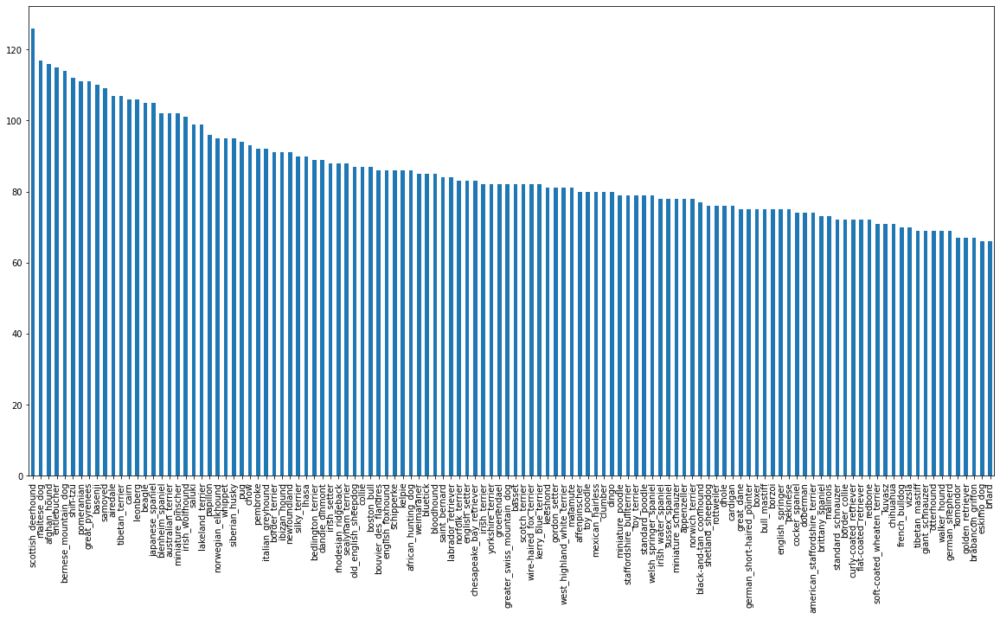

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

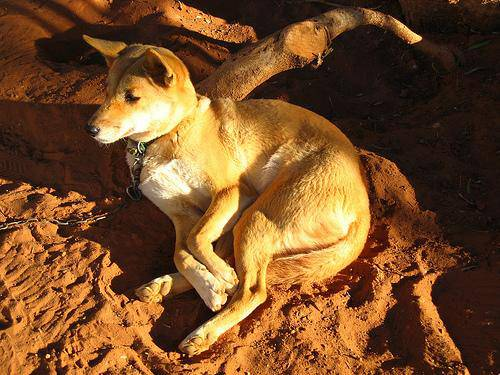

In [ ]:
# Viewing an image
from IPython.display import Image
Image("drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### 2. Getting images and their labels
List of all image file pathnames

In [ ]:
filenames = ['drive/My Drive/Dog Vision/train/'+ fname + '.jpg' for fname in labels_csv['id']]
filenames[:10]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check weather number of filenmaes matches with the actual number of image file in train set
import os 
if len(os.listdir("drive/My Drive/Dog Vision/train/")) == len(filenames):
  print("FILENAMES MATCH SUCCESSFUL !")
else:
  print("FILENAMES MATCH UNSUCCESSFUL !")

FILENAMES MATCH SUCCESSFUL !


irish_water_spaniel


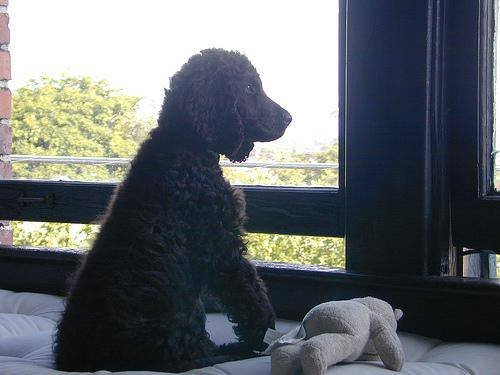

In [ ]:
print(labels_csv["breed"][2334])
Image(filenames[2334])

In [ ]:
import numpy as np
label_breed = np.array(labels_csv["breed"])
print("No of breeds:",len(label_breed))
label_breed

No of breeds: 10222


array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# Check number of labels matches with filenames
if len(filenames) == len(label_breed):
  print("MATCHING SUCCESSFUL !")
else:
  print("MATCHING UNSUCCESSFUL !")

MATCHING SUCCESSFUL !


In [ ]:
# Find the unique label values
unique_label_breed = np.unique(label_breed)
print("no of unique breeds:",len(unique_label_breed))
unique_label_breed

no of unique breeds: 120


array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# Turn a single label into a array of booleans
print(label_breed[0])
label_breed[0] == unique_label_breed

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_label_breed = [label == unique_label_breed for label in label_breed]
print("NUMBER OF BOOLEAN LABEL BREEDS:",len(boolean_label_breed))
boolean_label_breed[:2]

NUMBER OF BOOLEAN LABEL BREEDS: 10222


[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
 # Turning boolean array into integers (example)
 print(label_breed[0])
 print(np.where(unique_label_breed == label_breed[0])) # <--index where label occurs
 print(boolean_label_breed[0].argmax()) #<--index where label occurs in boolean array
 print(boolean_label_breed[0].astype(int)) #<--there will be 1 where sample label occurs (i.e. True)

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(label_breed[5])
print(boolean_label_breed[5].astype(int))

bedlington_terrier
[0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### 3. Creating a training and a validation set

In [ ]:
# Set up x(image) and y(label)
x = filenames
y = boolean_label_breed

start experimenting with 1000 images and then gradually increase

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:100}

In [ ]:
# Spliting data into train and validation sets
from sklearn.model_selection import train_test_split
x_train,x_val,y_train,y_val = train_test_split(x[:NUM_IMAGES],
                                               y[:NUM_IMAGES],
                                               test_size=0.2,
                                               random_state=42)
len(x_train),len(y_train),len(x_val),len(y_val)

(800, 800, 200, 200)

In [ ]:
x_train[:2],y_train[:2]

(['drive/My Drive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, F

### 4. Preprocessing Images (turning images into Tensors)


before working just viewing the format

**Processing only one image**

walker_hound


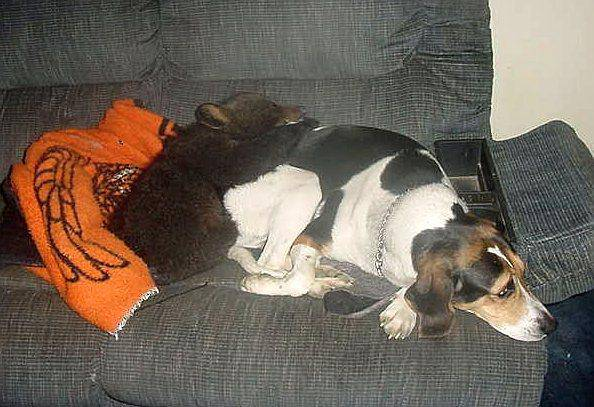

In [ ]:
print(labels_csv["breed"][34])
Image(filenames[34])

In [ ]:
# Convert an image into Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[34])
image.shape,image.max(),image.min()

((407, 594, 3), 255, 0)

In [ ]:
image[:2]

array([[[ 25,  26,  31],
        [ 24,  25,  30],
        [ 35,  36,  41],
        ...,
        [207, 200, 184],
        [205, 197, 184],
        [205, 197, 184]],

       [[ 41,  42,  47],
        [ 26,  27,  32],
        [ 38,  39,  44],
        ...,
        [207, 200, 184],
        [205, 197, 184],
        [205, 197, 184]]], dtype=uint8)

In [ ]:
# Converting the numpy array into tensors
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 594, 3), dtype=uint8, numpy=
array([[[ 25,  26,  31],
        [ 24,  25,  30],
        [ 35,  36,  41],
        ...,
        [207, 200, 184],
        [205, 197, 184],
        [205, 197, 184]],

       [[ 41,  42,  47],
        [ 26,  27,  32],
        [ 38,  39,  44],
        ...,
        [207, 200, 184],
        [205, 197, 184],
        [205, 197, 184]]], dtype=uint8)>

In [ ]:
tensor = tf.io.read_file(filenames[34])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\x97\x02R\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

2. 

In [ ]:
tensor = tf.image.decode_jpeg(tensor,channels=3)
tensor

<tf.Tensor: shape=(407, 594, 3), dtype=uint8, numpy=
array([[[ 22,  25,  30],
        [ 21,  24,  29],
        [ 32,  35,  40],
        ...,
        [206, 199, 183],
        [205, 198, 182],
        [205, 198, 182]],

       [[ 39,  42,  47],
        [ 23,  26,  31],
        [ 36,  39,  44],
        ...,
        [206, 199, 183],
        [205, 198, 182],
        [205, 198, 182]],

       [[ 28,  32,  35],
        [ 19,  23,  26],
        [ 31,  35,  38],
        ...,
        [206, 199, 183],
        [205, 198, 182],
        [205, 198, 182]],

       ...,

       [[ 42,  46,  49],
        [ 50,  54,  57],
        [ 52,  56,  59],
        ...,
        [  2,   9,  19],
        [  7,  11,  20],
        [  7,  11,  20]],

       [[ 32,  36,  39],
        [ 40,  44,  47],
        [ 46,  50,  53],
        ...,
        [  4,  11,  21],
        [  7,  11,  20],
        [  7,  11,  20]],

       [[ 21,  25,  28],
        [ 25,  29,  32],
        [ 32,  36,  39],
        ...,
        [  7,  14,  2

In [ ]:
tensor = tf.image.convert_image_dtype(tensor,tf.float32)
tensor

<tf.Tensor: shape=(407, 594, 3), dtype=float32, numpy=
array([[[0.08627451, 0.09803922, 0.11764707],
        [0.08235294, 0.09411766, 0.1137255 ],
        [0.1254902 , 0.13725491, 0.15686275],
        ...,
        [0.8078432 , 0.7803922 , 0.7176471 ],
        [0.80392164, 0.77647066, 0.7137255 ],
        [0.80392164, 0.77647066, 0.7137255 ]],

       [[0.15294118, 0.16470589, 0.18431373],
        [0.09019608, 0.10196079, 0.12156864],
        [0.14117648, 0.15294118, 0.17254902],
        ...,
        [0.8078432 , 0.7803922 , 0.7176471 ],
        [0.80392164, 0.77647066, 0.7137255 ],
        [0.80392164, 0.77647066, 0.7137255 ]],

       [[0.10980393, 0.1254902 , 0.13725491],
        [0.07450981, 0.09019608, 0.10196079],
        [0.12156864, 0.13725491, 0.14901961],
        ...,
        [0.8078432 , 0.7803922 , 0.7176471 ],
        [0.80392164, 0.77647066, 0.7137255 ],
        [0.80392164, 0.77647066, 0.7137255 ]],

       ...,

       [[0.16470589, 0.18039216, 0.19215688],
        [0.19

In [ ]:
tf.image.resize(tensor,size=[224,224])

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.09042301, 0.10218772, 0.12179556],
        [0.11473363, 0.12649834, 0.14610618],
        [0.09272581, 0.10449051, 0.12409835],
        ...,
        [0.8196079 , 0.79215693, 0.7294118 ],
        [0.8136382 , 0.78618723, 0.7234421 ],
        [0.80392164, 0.77647066, 0.7137255 ]],

       [[0.08168886, 0.09737513, 0.10913984],
        [0.09317888, 0.10886515, 0.12062985],
        [0.1127224 , 0.12840867, 0.14017338],
        ...,
        [0.8196079 , 0.79215693, 0.7294118 ],
        [0.8136382 , 0.78618723, 0.7234421 ],
        [0.80480576, 0.7773548 , 0.7146096 ]],

       [[0.1778584 , 0.19354467, 0.20530938],
        [0.10785257, 0.12353884, 0.13530354],
        [0.17694902, 0.1926353 , 0.2044    ],
        ...,
        [0.8196079 , 0.79215693, 0.7294118 ],
        [0.8136382 , 0.78618723, 0.7234421 ],
        [0.8078432 , 0.7803922 , 0.7176471 ]],

       ...,

       [[0.14830667, 0.16399294, 0.17575765],
        [0.15

STEPS:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable 'image'
3. Turn our 'image' (a jpg) into Tensors
4. Normalize the image (convert colour channels values 0-255 to 0-1).
5. Resize the 'image' to be a shape of (224,224)
6. Return the modified 'image'


In [ ]:
# Function defined below
(get_image_label(x[34],tf.constant(y[34])))

NameError: ignored

**Processing the whole lot of images**

In [ ]:
# Define image size
IMG_SIZE = 224

# Function for preprocessing images
#1. Take image filepath as input
def process_image(image_path,img_size=IMG_SIZE):
  """
  Takes an image file path and turn them into Tensors
  """
  # 2. Read in a image file
  image = tf.io.read_file(image_path)

  # 3. Turn the jpeg image into numerical Tensor with 3 colour channels (Red,Green,Blue)
  image = tf.image.decode_jpeg(image,channels=3)
  
  # 4. Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image,tf.float32)

  # 5. Resize the image to a desired value(224,224)
  image = tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  # 6. Return the modified image
  return image

### 5. Turning our data into batches

**Reason:** Processing all 10,000+ images at one go.. would not fit in memory.
So, 32 (aka standard Batch size) images is taken at a time. Batch size can be manually adjusted. (using 25)

In order to use TensorFlow effectively, data should be in form of Tensor Tuples '{image , label)'.



In [ ]:
# Function to return a Tensor Tuple (image, label)
def get_image_label(image_path,boolean_label_breed):
  """
  Takes an image file path name and the associated label, processses the image and
  returns a tuple (image,label)
  """
  image = process_image(image_path)
  return image,boolean_label_breed

In [ ]:
# Function to turn all of the data into Tensor Tuple (aka batches)
BATCH_SIZE = 25 # Default 32
def create_data_batches(x, y=None, batch_size = BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also, accepts test data as input (no labels).
  """
  # If the data is test dataset
  if test_data:
    print("Creating test data batches..")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(x)) #<--only filepath (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is in valid dataset (no shuffling is needed)
  elif valid_data:
    print("Creating validation data batches..")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # Filepath
                                              tf.constant(y))) # Labels 
    # Create (image, label) tuples (this also turns the image path into a preprocessed image) and turning them into data batch                               
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  # If the data is train dataset (Shuffling needed)
  else:
    print("Creating traning data batches..")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # Filepath
                                              tf.constant(y))) # Labels
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))
    # Create (image, label) tuples (this also turns the image path into a preprocessed image) and turning them into data batch
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

### 6. Creating training and validation data batches

In [ ]:
train_data = create_data_batches(x_train,y_train)
val_data = create_data_batches(x_val,y_val,valid_data=True)

Creating traning data batches..
Creating validation data batches..


In [ ]:
# Checking the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### 7. Visualizing Data Batches

In [ ]:
import matplotlib.pyplot as plt
# Function for viewing images in data batch
def show_25(images, boolean_label_breed):
  """
  Displays a plot of 25 images and their labels from data batch
  """
  fig =  plt.figure(figsize=(15,15))
  for i in range(25): 
    # Create subplots
    ax = fig.add_subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add label as title
    plt.title(unique_label_breed[boolean_label_breed[i].argmax()])
    # Turn the grid line off
    plt.axis("off")

#### Traning set
Output will change every time we run as shuffling is taking place

In [ ]:
train_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

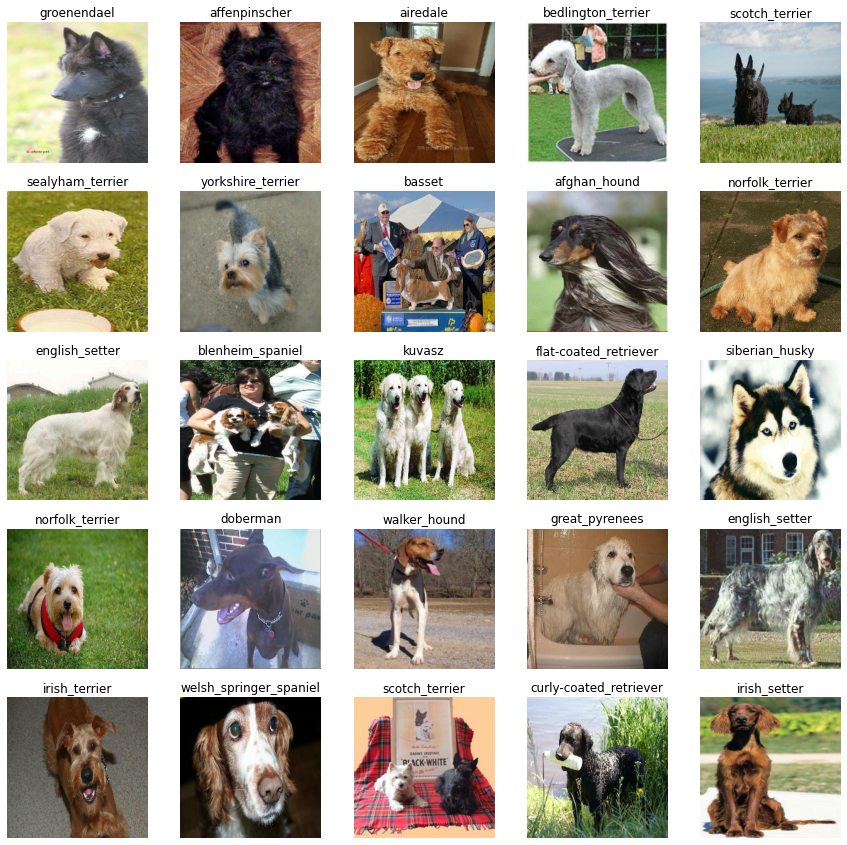

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25(train_images,train_labels)

In [ ]:
len(train_images), len(train_labels)

(25, 25)

#### Validation set
Output will remain constant every time we run as shuffling is not taking place

In [ ]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

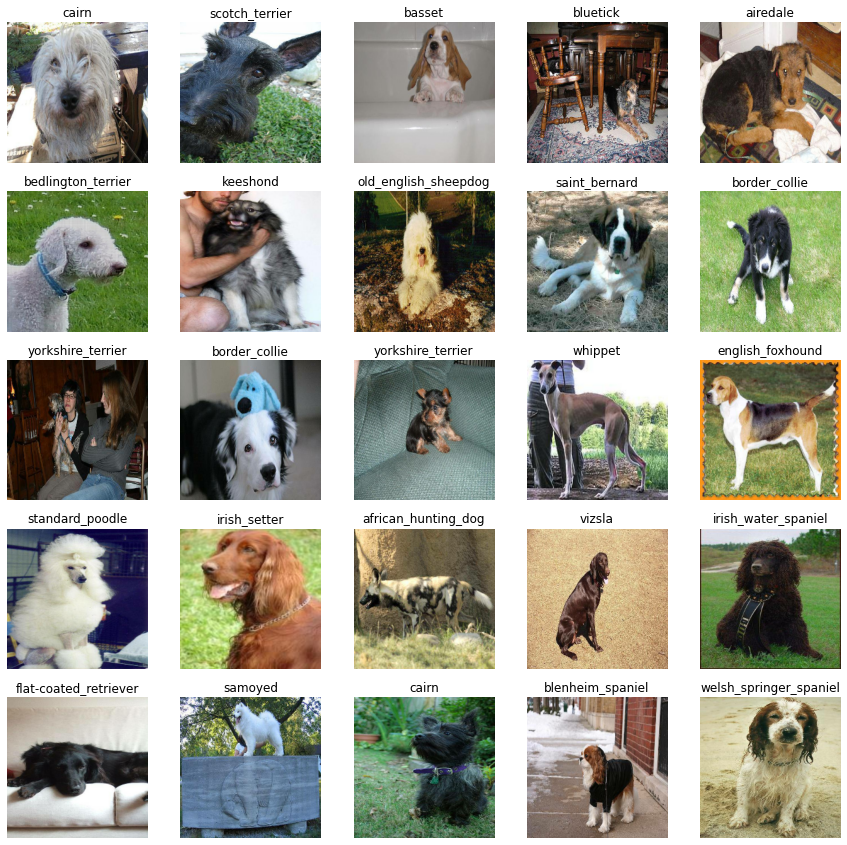

In [ ]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25(val_images,val_labels)

## 3. Building a model
* The input shape (our image shape,in form of Tensors) to the model.
* The output shape (image labels, in the for of Tensors) of the model.
* The URL of the model from TensorFlow Hub
to use https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

### 1. Setup input shape to the model

In [ ]:
IMG_SIZE

224

In [ ]:
INPUT_SHAPE = [None,IMG_SIZE,IMG_SIZE,3] #<-- batch,height,width,colour channels

### 2. Setup output shape of our model

In [ ]:
OUTPUT_SHAPE = len(unique_label_breed)

### 3. Setup model URL from TensorFlow Hub

In [ ]:
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

### Put them all together in **Keras Deep Learning model**

Create a function :
* Takes input shape, output shape and the model
* Defines the layers in a *Keras model* in sequential fashion
* Compiles the model (tells how model should be evaluated and improved)
* Bulids the model (tells the model shape it'll be getting)
* Returns the model

Reference: https://www.tensorflow.org/guide/keras/sequential_model

In [ ]:
# 1. Takes input shape, output shape and the model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:",MODEL_URL)

  # 2. Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation='softmax') # Layer 2 (output layer)
  ])

  # 3. Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(), 
      metrics=["accuracy"]
  )

  # 4. Build the model
  model.build(INPUT_SHAPE)

  # 5. Returns the model
  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## 4. Creating Callbacks 

Callbacks are helper functions a model can use during training (they save its progress, check its progress or stop training early if a model stops improving.)

Creating 2 callbacks:
* One for TensorBoard which helps in tracking the model progress 
* Two for earlystopping which prevents the model from training for too long.


### TensorBoard Callback

To setup:
* Load the TensorBoard notebook extension
* Create a TensorBoard callback which is able to save logs to a directory and pass it to our model fit() function.
* Visualize our models training logs with the '%tensorboard' magic function.

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

import datetime

# Create a function 
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Dog Vision/logs",
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))# <--LOGS are getting tracked everytime we make experiiment
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps to stop the model from overfitting by stopping training if a certain evaluation metric stops improving. 

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3)

 ## 5. Training the model


In [ ]:
NUM_EPOCHS = 100 #@param {type:'slider',min:10,max:100,step:1}

In [ ]:
# Checking for GPU availability
print("GPU","AVAILABLE :)"if tf.config.list_physical_devices("GPU") else "NOT AVAILABLE :(")

GPU AVAILABLE :)


### Function which trains a model
* Create a model using 'create_model()' function
* Setup a TensorBoard callback using 'create_tensorboard_callback()' function
* Call the 'fit()' function on the model passing it the training data, validation data, number of epochs to train for ('NUM_EPOCHS') and the callbacks
* Return the model

In [ ]:
def train_model():
  """
  Trains a given model and returns the trained model
  """
  # 1. Create a model
  model = create_model()

  # 2. Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # 3. Fit the model to the data passing it the callbacks
  model.fit(x=train_data,epochs=NUM_EPOCHS,validation_data=val_data,validation_freq=1,callbacks=[tensorboard,early_stopping])

  # 4. Return the model
  return model

### Fitting the model to the data

In [ ]:
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
 1/32 [..............................] - ETA: 0s - loss: 5.7851 - accuracy: 0.0000e+00WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.


Instructions for updating:
use `tf.profiler.experimental.stop` instead.


32/32 [==============================] - 492s 15s/step - loss: 4.4140 - accuracy: 0.1138 - val_loss: 3.1285 - val_accuracy: 0.3100
Epoch 2/100
32/32 [==============================] - 4s 125ms/step - loss: 1.3575 - accuracy: 0.7525 - val_loss: 1.9533 - val_accuracy: 0.5400
Epoch 3/100
32/32 [==============================] - 4s 120ms/step - loss: 0.4381 - accuracy: 0.9600 - val_loss: 1.5699 - val_accuracy: 0.6150
Epoch 4/100
32/32 [==============================] - 4s 119ms/step - loss: 0.1959 - accuracy: 0.9937 - val_loss: 1.4350 - val_accuracy: 0.6350
Epoch 5/100
32/32 [==============================] - 4s 122ms/step - loss: 0.1171 - accuracy: 0.9987 - val_loss: 1.3728 - val_accuracy: 0.6500
Epoch 6/100
32/32 [==============================] - 4s 122ms/step - loss: 0.0818 - accuracy: 1.0000 - val_loss: 1.3375 - val_accuracy: 0.6450
Epoch 7/100
32/32 [==============================] - 4s 123ms/step - loss: 0.0624 - accuracy: 1.0000 - val_loss: 1.3044 - val_accuracy: 0.6550
Epoch 8/100

*model is overfitting as because it is performing better on train dataset than validation dataset*

### Checking the TensorBoard logs

The TensorBoard magic function (%tensorboard) will access the logs directory created earlier and visualize its contents 

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs # \ is used to excape the spaces of the folder name

<IPython.core.display.Javascript object>

## 6. Making and evaluating predictions using a trained model

In [ ]:
# Making predictions on validation data
predictions = model.predict(val_data,verbose=1)
predictions

8/8 [==============================] - 1s 93ms/step


array([[4.5515760e-04, 2.6937071e-04, 9.2018658e-04, ..., 3.5022252e-04,
        4.6393539e-05, 1.7961643e-03],
       [2.0484782e-03, 2.9711871e-04, 2.4414878e-02, ..., 2.0726616e-04,
        3.2519193e-03, 4.6587738e-05],
       [5.3268795e-06, 6.9199566e-05, 2.8324062e-05, ..., 6.7645124e-05,
        3.5330300e-05, 1.6287393e-04],
       ...,
       [3.3934558e-07, 7.1949364e-07, 2.9500247e-06, ..., 6.1149001e-07,
        6.5429913e-07, 1.9049590e-06],
       [9.0159121e-04, 2.2880051e-05, 1.2257423e-04, ..., 3.3747128e-05,
        3.1772044e-05, 5.8531002e-03],
       [1.9834378e-04, 2.5625917e-05, 2.5487831e-04, ..., 2.5787773e-03,
        5.3408562e-04, 2.1812699e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
# First predictions
index = 0
print(predictions[index])
print(f'Max value (probability of predictions): {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_label_breed[np.argmax(predictions[index])]}')

[4.55157598e-04 2.69370707e-04 9.20186576e-04 9.69685498e-05
 1.20796124e-03 8.35106403e-06 6.89595193e-03 6.06570393e-04
 8.63147361e-05 4.06837137e-03 1.81840232e-03 3.87236447e-04
 2.91050645e-04 1.63053468e-04 1.21688284e-03 1.01659691e-03
 2.83412537e-05 1.14273965e-01 1.80942934e-05 9.98504984e-05
 1.24479574e-03 2.16181579e-04 4.82825862e-06 7.29746534e-04
 7.96520733e-04 5.66473536e-05 3.16552758e-01 3.04404275e-05
 2.20460017e-04 2.70669581e-04 1.45223021e-04 7.18796102e-04
 2.62893969e-04 5.33482926e-05 4.37176132e-05 1.79837346e-02
 6.47663728e-06 3.31588148e-04 5.86719871e-05 8.19432535e-05
 4.73464635e-04 2.88534211e-05 2.24843134e-05 1.50576350e-04
 1.89066959e-05 4.87067009e-05 1.31475426e-05 1.38080723e-04
 2.40413880e-04 6.27786576e-05 6.85322273e-04 7.34176647e-05
 8.22762158e-05 1.13429691e-04 1.87599144e-04 7.80566916e-05
 4.44579549e-04 4.69559524e-03 1.88601349e-04 1.92746818e-01
 2.49224831e-04 5.61173438e-05 2.41951854e-03 6.12082949e-05
 1.97305329e-04 1.149124

*Prediction probabilities are also know as Confidence levels*

In [ ]:
def get_pred_label(array_of_predictions_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_label_breed[np.argmax(array_of_predictions_probabilities)]

In [ ]:
for i in range(5):
  pred_label = get_pred_label(predictions[i])
  print(pred_label)

cairn
scotch_terrier
basset
lakeland_terrier
airedale


In [ ]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

*validation dataset is in a batch dataset , to make predictions on the validation images and then compare those predictions to the validation labels we have to unbatch validation dataset*

In [ ]:
# Create a function to unbatch validation dataset
def unbatchify(val_data):
  """
  Takes a batched dataset of (image,label) Tensors and returns seperate arrays
  of images and labels
  """
  images = []
  labels =[]
  for image,label in val_data.unbatch().as_numpy_iterator():
     images.append(image)
     labels.append(unique_label_breed[np.argmax(label)])
  return images, labels

In [ ]:
val_images, val_labels = unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

In [ ]:
get_pred_label(predictions[0])

'cairn'

NOW WE GOT:
 * Prediction labels 
 * Validation labels(truth labels)
 * Validation images(truth images)

LET'S VISUALIZE :)

Function:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integers.
* Convert the prrediction probabilities to a predicted tabel.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot


In [ ]:
def plot_pred(prediction_probabilites, labels, images, n=0):
  """
  To view the prediction, ground truth label and image for a sample n
  """
  # Data
  pred_prob, true_label, image = prediction_probabilites[n], labels[n], images[n]

  # Get predicted label
  pred_label = get_pred_label(pred_prob)

  # Plot image 
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Colour
  if pred_label == true_label:
    color = "green"
  else:
    color ="red"

  # Plot title, prediction probability and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label, np.max(pred_prob)*100, true_label),color = color)


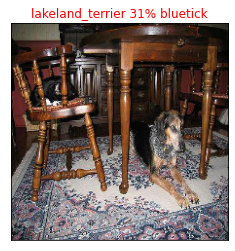

In [ ]:
plot_pred(predictions,val_labels,val_images,n=3)

In [ ]:
predictions[0]

array([4.55157598e-04, 2.69370707e-04, 9.20186576e-04, 9.69685498e-05,
       1.20796124e-03, 8.35106403e-06, 6.89595193e-03, 6.06570393e-04,
       8.63147361e-05, 4.06837137e-03, 1.81840232e-03, 3.87236447e-04,
       2.91050645e-04, 1.63053468e-04, 1.21688284e-03, 1.01659691e-03,
       2.83412537e-05, 1.14273965e-01, 1.80942934e-05, 9.98504984e-05,
       1.24479574e-03, 2.16181579e-04, 4.82825862e-06, 7.29746534e-04,
       7.96520733e-04, 5.66473536e-05, 3.16552758e-01, 3.04404275e-05,
       2.20460017e-04, 2.70669581e-04, 1.45223021e-04, 7.18796102e-04,
       2.62893969e-04, 5.33482926e-05, 4.37176132e-05, 1.79837346e-02,
       6.47663728e-06, 3.31588148e-04, 5.86719871e-05, 8.19432535e-05,
       4.73464635e-04, 2.88534211e-05, 2.24843134e-05, 1.50576350e-04,
       1.89066959e-05, 4.87067009e-05, 1.31475426e-05, 1.38080723e-04,
       2.40413880e-04, 6.27786576e-05, 6.85322273e-04, 7.34176647e-05,
       8.22762158e-05, 1.13429691e-04, 1.87599144e-04, 7.80566916e-05,
      

In [ ]:
predictions[0].argsort()

array([ 22,  36,   5,  92,  46, 112,  18,  44,  99,  42,  86,  16,  41,
       108,  27,  84,  75,  34, 118,  45,  33, 101,  61,  25,  38,  63,
        49,  51,  55,  39,  52,   8, 114, 115,   3,  69,  19, 107, 104,
        53,  47,  66,  30, 113,  91,  43,  85,  88,  13, 105,  67,  54,
        58,  71,  64, 111,  21,  28,  72,  95,  48,  60,  32,   1,  29,
        94,  98,  12,  37, 117,  11,  82,  80,  56,   0,  40, 110,   7,
        96,  50,  31,  23,  24,  74,   2, 116,  15,  90,   4,  14,  20,
        78, 119,  10,  62,  97,  76,  87,  77,  93,  89,   9,  83,  57,
        79,  81,   6,  65, 100,  35, 109,  73, 106, 103,  68, 102,  70,
        17,  59,  26])

In [ ]:
predictions[0].argsort()[-10:][::-1]

array([ 26,  59,  17,  70, 102,  68, 103, 106,  73, 109])

In [ ]:
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([0.31655276, 0.19274682, 0.11427397, 0.05412632, 0.0518579 ,
       0.05008264, 0.02898068, 0.02569048, 0.01907685, 0.01860152],
      dtype=float32)

In [ ]:
predictions[0].max(), predictions[0].argmax()

(0.31655276, 26)

FUNCTION TO VIEW FISRT 10 PREDICTIONS OF NTH IMAGE IN VALIDATION DATASET:
* Input an prediction probabilities array and a ground truth array and an integer
* Find the prediction using 'get_pred_label' function
* Find the top 10:
     * Prediction probabilities indexes
     * Prediction probabilities values
     * Prediction labels
* Plot the top 10 



In [ ]:
def plot_pred_conf(prediction_probabilites, labels, n=0):
  """
  Plot the top 10 highest prediction confidences along with the truth label for sample n
  """
  # Data
  pred_prob, true_label= prediction_probabilites[n], labels[n]

  # Get predicted label
  pred_label = get_pred_label(pred_prob)

  # Find top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_label_breed[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = "grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = 'vertical')
  
  # Change colour of true label
  if np.isin(true_label, top_10_pred_labels):
     top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
     pass


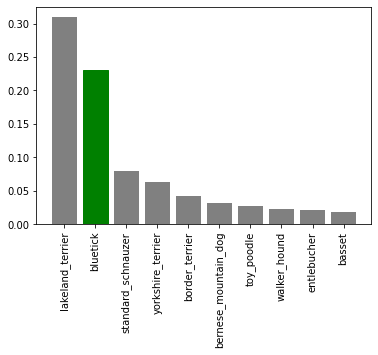

In [ ]:
plot_pred_conf(predictions,val_labels,n=3)

SOME OTHER VISUALIZTIONS

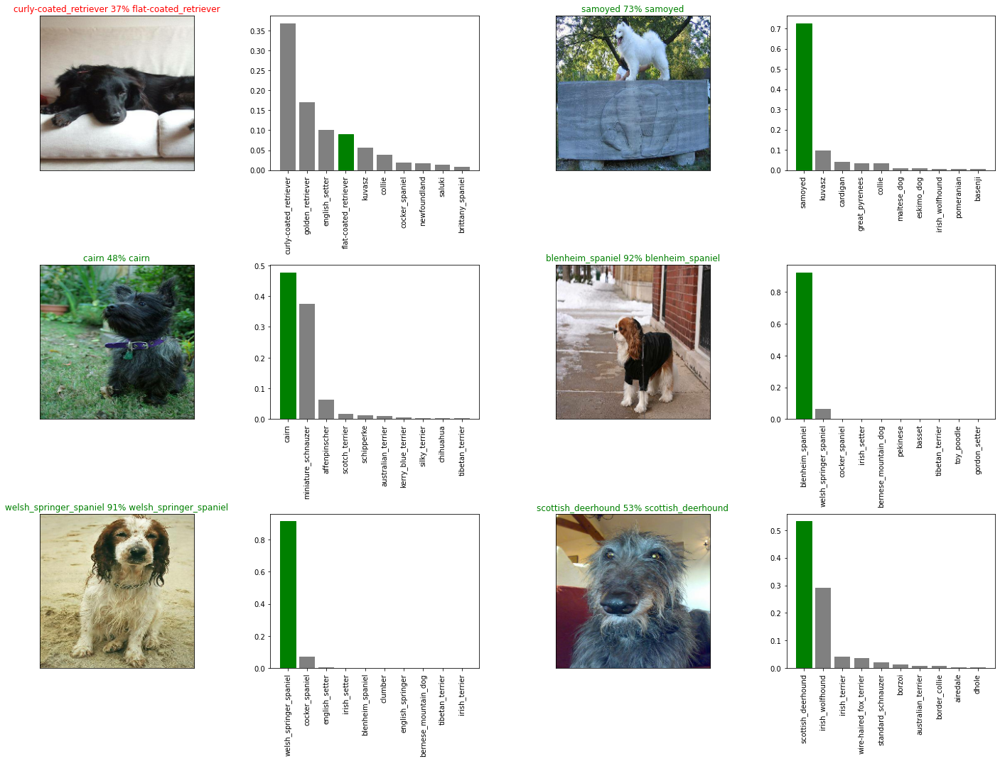

In [ ]:
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(predictions,val_labels,val_images,n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols,2*i+2)
  plot_pred_conf(predictions,val_labels,n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

Saving and reloding a trained model

In [ ]:
# Saving
def save_model(model,suffix=None):
  """
  Saves a given model in a model directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/My Drive/Dog Vision/models",
                          datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  model_path = modeldir + "-" + suffix + ".h5" #<--save format extention
  print(f'Saving model to: {model_path}...') 
  model.save(model_path)
  return model_path

In [ ]:
# Loading
def load_model(model_path):
  """
  Loads a saved model 
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Saving the model trained on 1000 images
save_model(model,suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20201101-160108-1000-images-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20201101-160108-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Loading the trained model
loaded_1000_image_model = load_model('drive/My Drive/Dog Vision/models/20201101-160108-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/My Drive/Dog Vision/models/20201101-160108-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

8/8 [==============================] - 88s 11s/step - loss: 5.7799 - accuracy: 0.0100


[5.779878616333008, 0.009999999776482582]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

8/8 [==============================] - 1s 105ms/step - loss: 1.2025 - accuracy: 0.6850


[1.2024835348129272, 0.6850000023841858]

## Training a Dog Breed Identification model (on the full data)

In [ ]:
len(x), len(y)

(10222, 10222)

In [ ]:
# Creating a data batch with the full data set
full_data = create_data_batches(x,y)

Creating traning data batches..


In [ ]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Create a model for full data set
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so validation accuracy cannnot be monitered
full_model_early_stopping_callback = tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=3)

**NOTE:** This cell **WILL TAKE A LONG TIME** so have patience

In [ ]:
# Fit the full_model to the full data
full_model.fit(x=full_data,epochs=NUM_EPOCHS,callbacks=[full_model_tensorboard, full_model_early_stopping_callback])

Epoch 1/100
  1/409 [..............................] - ETA: 0s - loss: 5.5285 - accuracy: 0.0000e+00WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.


Instructions for updating:
use `tf.profiler.experimental.stop` instead.


409/409 [==============================] - 5388s 13s/step - loss: 1.2842 - accuracy: 0.6812
Epoch 2/100
409/409 [==============================] - 54s 132ms/step - loss: 0.3854 - accuracy: 0.8863
Epoch 3/100
409/409 [==============================] - 53s 129ms/step - loss: 0.2212 - accuracy: 0.9395
Epoch 4/100
409/409 [==============================] - 54s 131ms/step - loss: 0.1404 - accuracy: 0.9675
Epoch 5/100
409/409 [==============================] - 53s 131ms/step - loss: 0.0954 - accuracy: 0.9797
Epoch 6/100
409/409 [==============================] - 50s 122ms/step - loss: 0.0681 - accuracy: 0.9885
Epoch 7/100
409/409 [==============================] - 50s 123ms/step - loss: 0.0509 - accuracy: 0.9920
Epoch 8/100
409/409 [==============================] - 53s 130ms/step - loss: 0.0392 - accuracy: 0.9949
Epoch 9/100
409/409 [==============================] - 53s 131ms/step - loss: 0.0315 - accuracy: 0.9961
Epoch 10/100
409/409 [==============================] - 54s 132ms/step - los

In [ ]:
save_model(full_model, suffix="full-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20201102-092459-full-images-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20201102-092459-full-images-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_image_model = load_model("drive/My Drive/Dog Vision/models/20201102-092459-full-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/My Drive/Dog Vision/models/20201102-092459-full-images-mobilenetv2-Adam.h5


### Making predictions on test dataset
MODEL IS TRAINED ON IMAGES IN THE FORM OF TENSOR BATCHES SO TEST DATA SHOULD ALSO BE IN THIS FORMAT

Procedure to make predictions:
* Get the test image filenames
* Convert the filenames into test data batches using 'create_data_batches()' function and setting the 'test_data' parameter to 'True' (since the test data doesn't have labels).
* Make a predictions array by passing test batches to the 'predict()' method called on the model

In [ ]:
# Load test image filenames
test_path = "drive/My Drive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/My Drive/Dog Vision/test/f569c5b12fae4ca37d376d21bc05f2b3.jpg',
 'drive/My Drive/Dog Vision/test/e823ee1ca007c88600806925a6f2bce1.jpg',
 'drive/My Drive/Dog Vision/test/f5319adc463ccf7e82f10a34ce39c190.jpg',
 'drive/My Drive/Dog Vision/test/f1040b51b35ad34a0d35068af4e9cc2f.jpg',
 'drive/My Drive/Dog Vision/test/ea54171754dc00a910fd4ed0cb41e765.jpg',
 'drive/My Drive/Dog Vision/test/f16a73d54d86c0020bf1d63a29eb024b.jpg',
 'drive/My Drive/Dog Vision/test/f14fea2fe647a06dce75eb19dbf1273f.jpg',
 'drive/My Drive/Dog Vision/test/f232ed4d2958c9b13ec8922933a852e4.jpg',
 'drive/My Drive/Dog Vision/test/f3094b103a8d45b2c1026f2d5bb4c687.jpg',
 'drive/My Drive/Dog Vision/test/e9a092de78948af4ab9ec3f8027a5d54.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batches
test_data = create_data_batches(test_filenames,test_data=True)

Creating test data batches..


In [ ]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

**NOTE:** Calling 'predict()' on the full model and passing it the test data batch **WILL TAKE SOME TIME (ABOUT 1 HR)**

In [ ]:
# Make predictions on test data
test_predictions = loaded_full_image_model.predict(test_data,verbose=1)

415/415 [==============================] - 5388s 13s/step


In [ ]:
# Save predictions (Numpy array) to csv file
np.savetxt("drive/My Drive/Dog Vision/test_preds_array.csv",test_predictions, delimiter=",")

In [ ]:
# Load predictions (Numpy array) from csv file
test_predictions = np.loadtxt("drive/My Drive/Dog Vision/test_preds_array.csv",delimiter=",")

In [ ]:
test_predictions.shape

(10357, 120)

In [ ]:
test_predictions[:10]

array([[2.98571194e-07, 7.80634758e-12, 4.96890695e-10, ...,
        4.19733404e-09, 1.32746578e-08, 7.24456370e-08],
       [4.70267647e-09, 3.89633487e-06, 6.50336396e-10, ...,
        1.11108825e-07, 2.15302646e-01, 6.79266861e-07],
       [7.39700913e-15, 9.16709431e-18, 6.09147945e-14, ...,
        1.27058588e-13, 1.47415984e-15, 2.22573339e-16],
       ...,
       [9.50053192e-08, 6.67849370e-12, 4.96305705e-11, ...,
        1.78262678e-12, 3.76888104e-11, 7.75272138e-11],
       [1.04910219e-16, 1.15169164e-14, 2.00332677e-14, ...,
        3.09174852e-14, 1.63211859e-12, 2.58825486e-13],
       [8.73474983e-06, 3.22752989e-08, 2.12010427e-08, ...,
        1.63100005e-08, 1.74851762e-03, 7.48125501e-07]])

## Preparing test dataset predictions for Kaggle

**FORMAT:** Prediction probability outputs in a DataFrame with ID column and the a column for each dog breed

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

Procedure:
* Creating pandas DataFrame with ID column and a column for each dog breed
* Adding data to the ID column by extracting test image ID'S from their filenames
* Adding the prediction probabilities to each dog breed column
* Expotingthe DataFrame as a CSV to submit to Kaggle

In [ ]:
# Creating a pandas DataFrame
preds_df = pd.DataFrame(columns=["id"] + list(unique_label_breed))
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Filling the ID column
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
# Adding prediction probablities
preds_df[list(unique_label_breed)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,f569c5b12fae4ca37d376d21bc05f2b3,2.98571e-07,7.80635e-12,4.96891e-10,7.23719e-10,2.59696e-09,1.89066e-11,1.58338e-09,2.69246e-08,2.10924e-10,2.79815e-08,3.60281e-08,2.677e-10,1.07222e-10,7.81464e-13,1.68116e-13,9.25438e-10,1.31609e-08,3.83816e-10,7.85465e-12,0.316034,4.34165e-11,1.01671e-10,5.24761e-08,9.63589e-12,1.48043e-11,9.7097e-13,1.62986e-08,1.57281e-08,1.66931e-13,0.00251738,2.13098e-11,2.78157e-13,3.61677e-11,7.30237e-09,3.68195e-10,1.05699e-11,1.08952e-11,2.09803e-12,6.62282e-07,...,5.6444e-11,2.18784e-12,1.02574e-09,5.76884e-15,2.22046e-08,1.25877e-08,2.41458e-12,3.28616e-09,5.01374e-08,4.42201e-09,2.32288e-15,1.00387e-12,2.26708e-12,1.98489e-10,2.68021e-10,8.07162e-09,9.19521e-10,2.03731e-10,5.3756e-11,5.59732e-11,3.11434e-06,1.30248e-09,1.85867e-08,1.48654e-11,5.99152e-09,1.6351e-12,1.30447e-10,8.45641e-10,8.57525e-12,1.91738e-11,3.21616e-05,0.0010661,5.90924e-12,1.01028e-11,4.47361e-08,4.39606e-11,3.82412e-07,4.19733e-09,1.32747e-08,7.24456e-08
1,e823ee1ca007c88600806925a6f2bce1,4.70268e-09,3.89633e-06,6.50336e-10,0.000347348,3.04732e-09,3.96475e-08,1.87497e-06,9.79389e-07,3.07391e-09,2.83744e-10,4.10646e-07,1.07902e-09,6.22386e-08,9.29335e-09,1.51873e-06,1.13684e-09,1.1715e-08,4.26323e-05,4.34038e-08,8.05073e-10,1.96297e-10,2.0403e-08,1.32034e-05,2.866e-07,9.50235e-10,3.31506e-10,4.00821e-09,2.81397e-10,1.48236e-09,6.99523e-08,6.74158e-10,2.83932e-09,1.90521e-08,4.90479e-09,1.62864e-10,1.5382e-07,8.13469e-06,1.70878e-05,8.61394e-07,...,1.89265e-10,1.008e-05,8.76935e-09,5.78968e-09,7.13904e-09,1.65787e-08,1.21333e-06,2.06325e-10,8.46682e-11,1.01007e-07,3.81191e-06,1.58644e-09,7.75798e-11,1.68442e-11,1.59387e-10,9.85834e-11,2.39717e-05,1.1097e-06,7.30337e-07,1.98787e-11,6.57194e-09,9.49726e-12,6.61116e-05,3.50137e-07,2.66168e-06,1.53754e-07,0.000214798,3.73462e-08,1.73156e-09,5.94146e-11,3.4493e-06,8.96018e-07,1.30311e-07,7.71802e-09,5.30784e-11,2.48815e-06,5.6507e-08,1.11109e-07,0.215303,6.79267e-07
2,f5319adc463ccf7e82f10a34ce39c190,7.39701e-15,9.16709e-18,6.09148e-14,2.65115e-15,1.08177e-12,3.2523e-16,7.35807e-13,3.84023e-16,7.61685e-18,7.76436e-18,1.41933e-14,6.63908e-18,2.20602e-15,1.20348e-19,2.45489e-19,3.93952e-17,1.54399e-15,1.13805e-16,2.68317e-19,1.98091e-10,5.27051e-16,3.08407e-16,8.41772e-17,4.08486e-16,8.19566e-19,4.17991e-17,2.54576e-14,5.52938e-15,2.9505e-18,1.08035e-11,1.73741e-18,6.52831e-16,1.65017e-18,7.0049e-15,1.95423e-14,2.24462e-16,1.28544e-17,7.28638e-17,6.32044e-11,...,5.00365e-12,4.78186e-18,1.30476e-17,1.92653e-17,1.97012e-14,1.23341e-15,2.53584e-19,1.0606e-14,3.48761e-16,1.16659e-12,6.71909e-16,4.08219e-19,3.43967e-18,1.5164e-18,1.23166e-14,1.11421e-14,5.43712e-13,2.03053e-14,2.24457e-13,1.78441e-17,8.77742e-14,6.60697e-18,1.3431e-13,1.15261e-15,1.68289e-12,4.81156e-18,6.31078e-13,7.06538e-16,2.00112e-17,2.14813e-15,3.3762e-13,8.07978e-11,1.20579e-14,9.84556e-18,5.52404e-13,3.67387e-17,5.38681e-1

In [ ]:
# Exporting to CSV
preds_df.to_csv("drive/My Drive/Dog Vision/full_model_test_predictions_submission_1_mobilenetV2.csv",
                index=False)
print("Saved")

Saved


## Making predictions on custom images

Procedure to make predictions:
* Get the test image filenames
* Convert the filenames into test data batches using 'create_data_batches()' function and setting the 'test_data' parameter to 'True' (since the test data doesn't have labels).
* Make a predictions array by passing test batches to the 'predict()' method called on the model
* Convert the prediction output probabilities to the predicted label
* Compare the predicted labels to the custom images

In [ ]:
# Getting custom  image filepaths
custom_path = "drive/My Drive/Dog Vision/my_dog_photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]
custom_image_paths

['drive/My Drive/Dog Vision/my_dog_photos/dog1.jpg',
 'drive/My Drive/Dog Vision/my_dog_photos/dog4.jpg',
 'drive/My Drive/Dog Vision/my_dog_photos/dog2.jpg',
 'drive/My Drive/Dog Vision/my_dog_photos/dog3.jpg']

In [ ]:
# Turn custom images into data batches
custom_data = create_data_batches(custom_image_paths,test_data=True)
custom_data

Creating test data batches..


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [ ]:
# Making predictions on custom data
custom_preds = loaded_full_image_model.predict(custom_data)

In [ ]:
# Converting predictions into labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['great_pyrenees', 'samoyed', 'golden_retriever', 'labrador_retriever']

In [ ]:
# Get custom images
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

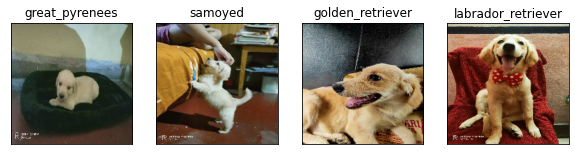

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,len(custom_pred_labels),i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)